# Using GIXStapose to Generate Reproducible Figures

Imagine, you've just finished running a parameter sweep of 10 different temperatures, 10 different pressures, and 10 different compounds. You've used a GUI for chemical structure visualization and painstakenly rotated and zoomed to create some really nice figures--it took you a day and a half, but now you're ready to add these figures to your publication. However, when you show the figures you made to your advisor, she asks for a view from a different angle and using a different color scheme...

GIXStapose can be used as a GUI, which may be useful for exploring the connection between morphology and diffraction, but it can also be used in a standalone workflow to more easily generate reproducible figures. In this notebook, we will demonstrate how to use the GIXStapose library outside of the GUI including
- reproducing the exact figure seen in the GUI 
- exploring real (messy) simulation data

![gixstapose/data/screenshot.png](gixstapose/data/screenshot.png)

In [1]:
import PIL
import matplotlib.pyplot as plt
from fresnel import camera, pathtrace
import mbuild as mb
from gixstapose.draw_scene import create_scene
from gixstapose.diffractometer import Diffractometer

We'll use the mbuild's `load` function to load a gsd file into an [`mbuild.Compound`](https://mbuild.mosdef.org/en/stable/data_structures.html#compound). Then we'll use the `create_scene` function to create a [`fresnel.Scene`](https://fresnel.readthedocs.io/en/stable/examples/00-Basic-tutorials/04-Scene-properties.html) from the compound.

`create_scene` by default will use the [cpk color map](https://en.wikipedia.org/wiki/CPK_coloring#Typical_assignments), but you can also use any [matplotlib colormap](https://matplotlib.org/tutorials/colors/colormaps.html). This is especially useful when working with coarse-grain or other non-atomistic systems.

In [2]:
compound = mb.load("gixstapose/data/sc10.pdb")
scene = create_scene(compound)

Next we can set a `fresnel.camera` object with the same parameters as the one shown above in the GUI, and connect that camera object to the scene.

You can easily get the camera parameters from the GUI by selecting "Print Camera" in the GIXStapose menu bar.

In [3]:
cam = camera.orthographic(
    position = [1.412, 0.698, 0.720],
    look_at  = [0.000, 0.000, 0.000],
    up       = [-0.292, -0.333, 0.896],
    height   = 1.500
)
scene.camera = cam

The next cell will take a minute to run but shows how to easily create the same image as the GUI!

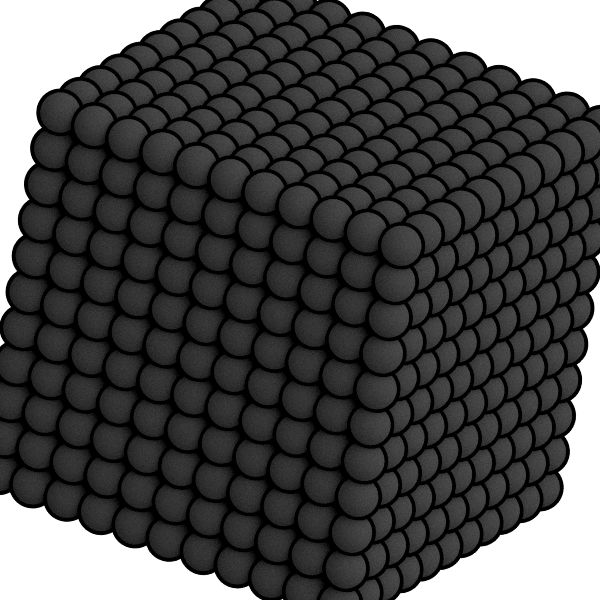

In [4]:
output = pathtrace(scene, light_samples=40, w=600, h=600)
output

Then we can save this output using python image library (PIL)

In [5]:
image = PIL.Image.fromarray(output[:], mode='RGBA')
image.save("structure.png", dpi=(300, 300))

In a similar fashion, we can use the `load_compound` function to load the compound particle positions and box into the Diffractometer class and then choose a diffraction angle based on the camera position using the `diffract_from_camera` function.

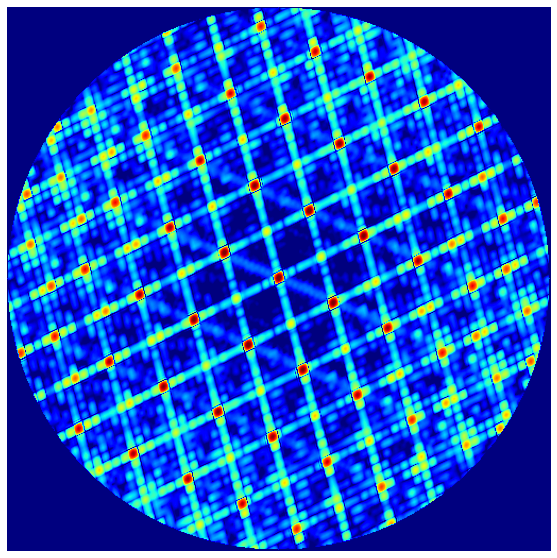

In [6]:
d = Diffractometer()
d.load_compound(compound)
dp = d.diffract_from_camera(cam)
fig,ax = plt.subplots(figsize=(10,10))
ax.axis("off")
ax.set_axis_off()
ax.imshow(dp, cmap="jet");

And the diffraction pattern can be easily saved using the savefig option.

In [7]:
fig.savefig("diffraction.png")

Finally let's look at a messy example using real simulation data. This xml file was taken from [https://doi.org/10.18122/cme_lab/4/boisestate](https://doi.org/10.18122/cme_lab/4/boisestate).

The original file can be found in p3ht_data/1000_oligomers/crystallinities/crystalline.xml. (The file was converted from an xml to a mol2 and reduced to contain only the backbone carbons (type CA) so it would load more quickly.) This is from one of our labs united-atom simulations of organic photovoltaic polymers, specifically [P3HT](http://gisaxs.com/index.php/Material:P3HT). Even with these simplifications, it is still a large file, so the next cell may be a little slow.

We can use mbuild's built-in `visualize` function to quickly look at our structure, but it is not quite as useful for generating high-resolution images.

In [13]:
p3ht = mb.load("gixstapose/data/crystalline_CAonly.mol2")
p3ht.visualize().show()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

Next let's choose a camera position. I chose this camera position by using the GUI to find distinct diffraction peaks.

In [14]:
cam = camera.orthographic(
   position = [2.892, 5.120, -0.830],
   look_at =  [-0.797, 0.604, 0.862],
   up =       [-0.733, 0.390, -0.557],
   height =   7.307
)

Next let's create a scene from this compound--I'm going to use a custom colormap to set the CA type to be gray. There's a lot of additional modifications that can be done the the fresnel scene--I highly recommend [their tutorials](https://fresnel.readthedocs.io/en/stable/examples/00-Basic-tutorials/00-Introduction.html). But for this example, lets connect the camera and render it!

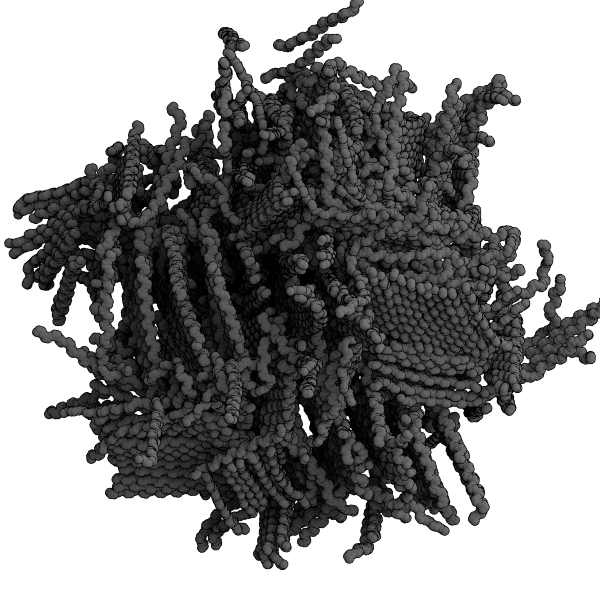

In [15]:
p3ht_scene = create_scene(p3ht, color={"CA":"gray"})
p3ht_scene.camera = cam
p3ht_output = pathtrace(p3ht_scene, light_samples=40, w=600, h=600)
p3ht_output

This angle allows us to see the lamellar structure between the backbone carbons. Let's also look at the diffraction pattern.

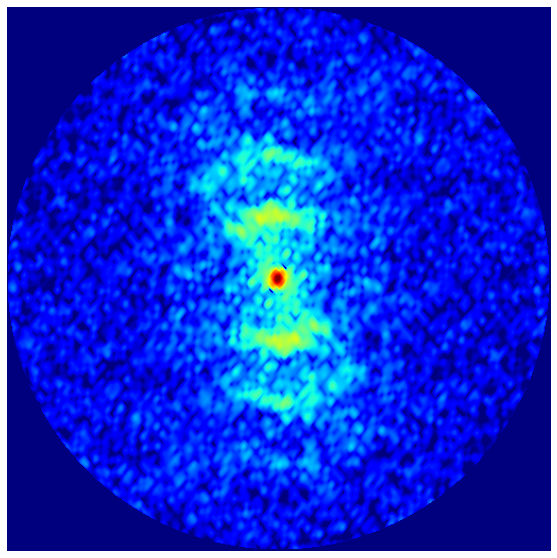

In [16]:
d = Diffractometer()
d.load_compound(p3ht)
dp = d.diffract_from_camera(cam)
fig,ax = plt.subplots(figsize=(10,10))
ax.axis("off")
ax.set_axis_off()
ax.imshow(dp, cmap="jet");

Although not as dramatic as the perfect crystal structure, we can begin to see some evidence of the lamellar structure in the diffraction pattern as well.